In [1]:
import numpy as np
import pandas as pd
import gower
import matplotlib.pyplot as plt
from pycaret.clustering import *
from ipywidgets import *
import seaborn as sns


In [2]:
#df = pd.read_excel("/home/dsg/Escritorio/CCA2024/DATA/cuerpos_preprocessed.xlsx",sheet_name='encoded_int', engine='openpyxl')
df = pd.read_csv("./intermediate_data/datos_preprocesados.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 578 entries, 0 to 577
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Unnamed: 0       578 non-null    int64
 1   Coccion          578 non-null    int64
 2   T_desgrasante    578 non-null    int64
 3   Composicion      578 non-null    int64
 4   Densidad         578 non-null    int64
 5   Textura          578 non-null    int64
 6   Grosor₍mm)       578 non-null    int64
 7   Tamaño(cm)       578 non-null    int64
 8   Acabado_Interno  578 non-null    int64
 9   Acabado_Externo  578 non-null    int64
 10  Dureza           578 non-null    int64
 11  Ahumado          578 non-null    int64
 12  Tecnica          578 non-null    int64
 13  Elemento₁        578 non-null    int64
 14  Localizacion     578 non-null    int64
 15  Baño             578 non-null    int64
 16  Engobe           578 non-null    int64
dtypes: int64(17)
memory usage: 76.9 KB


In [53]:
df = df.drop(['Unnamed: 0'], axis=1)

df.head()

KeyError: "['Unnamed: 0'] not found in axis"

In [54]:
df.head()

,Coccion,T_desgrasante,Composicion,Densidad,Textura,Grosor₍mm),Tamaño(cm),Acabado_Interno,Acabado_Externo,Dureza,Ahumado,Tecnica,Elemento₁,Localizacion,Baño,Engobe
0,1,2,5,1,0,7,3,2,2,0,0,0,0,0,0,0
1,0,2,6,0,0,12,5,2,2,0,0,0,0,0,0,0
2,0,2,6,0,0,8,3,2,2,0,0,0,0,0,0,0
3,0,2,6,1,0,10,3,1,1,1,0,0,0,0,0,0
4,0,1,6,0,0,7,3,1,2,0,0,2,1,1,0,0


In [4]:
data = df.sample(frac=0.95, random_state=786).reset_index(drop=True)
data_unseen = df.drop(data.index).reset_index(drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (549, 16)
Unseen Data For Predictions: (29, 16)


In [5]:
#Matriz de similaridad con distancia Gower
gower_data = data.copy().astype(float)
gower_data.head()

,Coccion,T_desgrasante,Composicion,Densidad,Textura,Grosor₍mm),Tamaño(cm),Acabado_Interno,Acabado_Externo,Dureza,Ahumado,Tecnica,Elemento₁,Localizacion,Baño,Engobe
0,0.0,2.0,2.0,0.0,0.0,7.0,3.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,2.0,0.0,0.0,8.0,3.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1.0,3.0,0.0,0.0,8.0,3.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,5.0,0.0,0.0,6.0,3.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,3.0,1.0,1.0,0.0,12.0,3.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [7]:
D = gower.gower_matrix(gower_data)
D

array([[0.        , 0.02430556, 0.09722222, ..., 0.1235119 , 0.02083333,
        0.04166667],
       [0.02430556, 0.        , 0.07291666, ..., 0.10615079, 0.00347222,
        0.06597222],
       [0.09722222, 0.07291666, 0.        , ..., 0.03323413, 0.07638889,
        0.1388889 ],
       ...,
       [0.1235119 , 0.10615079, 0.03323413, ..., 0.        , 0.10267857,
        0.16517857],
       [0.02083333, 0.00347222, 0.07638889, ..., 0.10267857, 0.        ,
        0.0625    ],
       [0.04166667, 0.06597222, 0.1388889 , ..., 0.16517857, 0.0625    ,
        0.        ]], dtype=float32)

In [55]:

D_df = pd.DataFrame(D)
D_df.shape

(549, 549)

In [46]:
exp_clu101 = setup(D_df, normalize = True,
                   session_id = 123)



,Description,Value
0,Session id,123
1,Original data shape,"(549, 549)"
2,Transformed data shape,"(549, 549)"
3,Numeric features,549
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,Normalize,True
9,Normalize method,zscore


In [34]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [47]:
hclus = create_model('hclust', metric='precomputed', linkage='average',num_clusters=4)



,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3537,205.4133,1.2805,0,0,0


Processing:   0%|          | 0/3 [00:00<?, ?it/s]

In [48]:
print(hclus)


AgglomerativeClustering(linkage='average', metric='precomputed', n_clusters=4)


In [57]:
hclus_results = assign_model(hclus,transformation=True)
hclus_results


,0,1,2,3,4,5,6,7,8,9,...,540,541,542,543,544,545,546,547,548,Cluster
0,-1.709712,-1.445152,-0.654546,-0.581240,-0.946485,-1.057570,-1.055720,-0.771666,-1.385126,-0.243622,...,-1.577121,-0.270621,-1.159086,-0.578990,-1.194468,-0.208139,-0.548645,-1.488223,-1.562784,Cluster 1
1,-1.364275,-1.800781,-1.021084,-0.844670,-0.711801,-0.766762,-0.730765,-1.189189,-1.655363,0.205490,...,-1.225453,-0.633667,-0.908769,-0.266598,-0.936834,0.215830,-0.805006,-1.740946,-1.212238,Cluster 1
2,-0.327966,-0.733896,-2.120697,-0.054379,0.273871,-1.639185,-0.034433,-0.294498,-0.520369,-1.141847,...,-0.170448,-1.722806,0.142563,0.670579,0.145228,-1.056079,-1.881723,-0.679511,-0.160600,Cluster 3
3,-0.179922,-0.479876,0.026168,-2.214509,0.508555,0.745438,-0.545077,-1.069897,-0.358227,0.077173,...,-0.120210,-0.218757,0.392880,-0.534362,0.402862,-0.995512,0.117894,-0.527877,-0.711458,Cluster 1
4,1.349868,1.603091,2.487208,2.685297,-3.856567,2.315799,1.822452,0.659839,1.965808,0.654603,...,1.236225,2.633748,-2.861243,-0.757499,-1.297522,2.820217,2.630233,1.645539,1.542052,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
544,-0.130574,0.078969,0.916331,1.104715,-2.448463,0.570953,0.429788,-1.129543,0.344388,-0.500258,...,-0.270925,1.077836,-2.560862,-1.560793,-2.843326,1.730009,1.092066,0.129202,0.039712,Cluster 0
545,0.560299,0.891834,-0.445095,-0.475868,0.649366,-0.475954,0.429788,0.540547,1.101051,-2.040072,...,0.633365,-0.374349,1.143832,-0.400480,1.175764,-2.994227,-0.343556,0.836826,0.039712,Cluster 3
546,0.045669,-0.247628,-1.619513,0.344530,0.723123,-1.082496,0.317049,0.276401,-0.111154,-0.656072,...,-0.048441,-1.226396,0.621741,0.778960,0.638413,-0.597500,-2.372471,-0.296816,0.218562,Cluster 3
547,-1.413623,-1.749977,-0.968721,-0.897357,-0.664865,-0.708601,-0.777187,-1.129543,-1.709411,0.141332,...,-1.275692,-0.581804,-0.858706,-0.311225,-0.885308,0.155263,-0.856278,-1.791491,-1.262316,Cluster 1


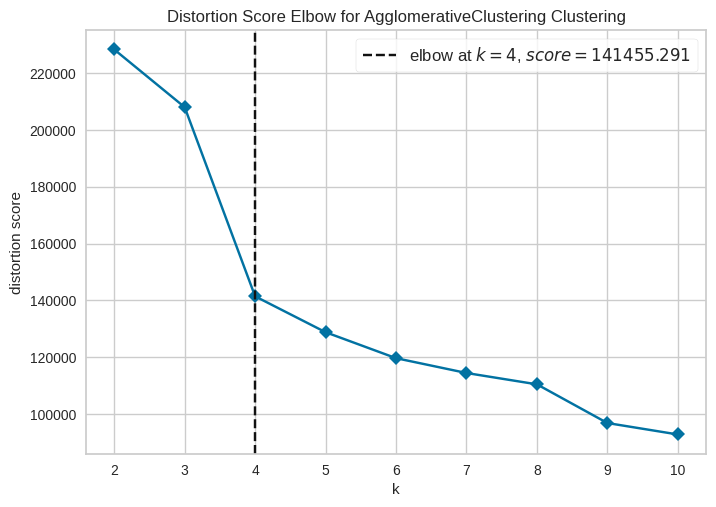

In [50]:
plot_model(hclus, plot = 'elbow')#save=True

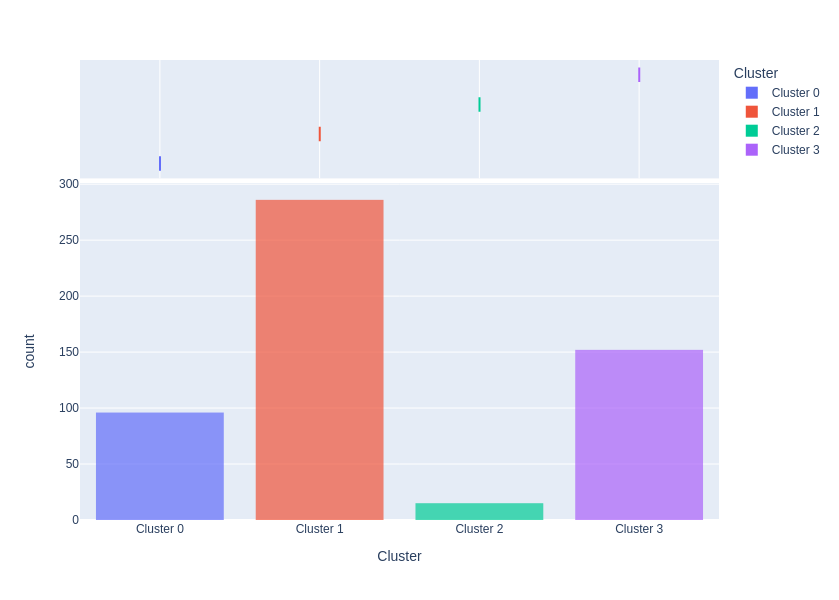

In [51]:
plot_model(hclus, plot = 'distribution') 

In [18]:
gower_unseendata = data_unseen.copy().astype(float)
gower_unseendata.head()

,Coccion,T_desgrasante,Composicion,Densidad,Textura,Grosor₍mm),Tamaño(cm),Acabado_Interno,Acabado_Externo,Dureza,Ahumado,Tecnica,Elemento₁,Localizacion,Baño,Engobe
0,1.0,1.0,5.0,0.0,0.0,8.0,3.0,3.0,3.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0
1,0.0,1.0,6.0,0.0,0.0,5.0,2.0,3.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,2.0,6.0,0.0,0.0,7.0,2.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,2.0,6.0,0.0,0.0,11.0,3.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,2.0,0.0,0.0,5.0,3.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
D_unseen = gower.gower_matrix(gower_unseendata)
D_unseen 

array([[0.        , 0.18020834, 0.26145834, 0.253125  , 0.253125  ,
        0.24062501, 0.26145834, 0.24062501, 0.31875   , 0.37708333,
        0.359375  , 0.34895834, 0.246875  , 0.22395833, 0.153125  ,
        0.28645834, 0.39270833, 0.23125   , 0.34479168, 0.35729167,
        0.32395834, 0.271875  , 0.25729167, 0.16770834, 0.29375   ,
        0.346875  , 0.28645834, 0.215625  , 0.278125  ],
       [0.18020834, 0.        , 0.10625   , 0.15208334, 0.14583333,
        0.15833333, 0.16041666, 0.13958333, 0.37395835, 0.353125  ,
        0.28958333, 0.20625   , 0.15208334, 0.08125   , 0.02708333,
        0.34166667, 0.44791666, 0.28645834, 0.23125   , 0.21875   ,
        0.25416666, 0.18958333, 0.1875    , 0.0125    , 0.19895834,
        0.20833333, 0.14375   , 0.08958334, 0.18333334],
       [0.26145834, 0.10625   , 0.        , 0.17083333, 0.25208333,
        0.23958334, 0.17916667, 0.15833333, 0.39270833, 0.396875  ,
        0.30833334, 0.225     , 0.24583334, 0.1625    , 0.12083334,
  

In [21]:
unseen_predictions = predict_model(hclus, data=D_unseen)
unseen_predictions.head()

KeyError: "['feature_30', 'feature_31', 'feature_32', 'feature_33', 'feature_34', 'feature_35', 'feature_36', 'feature_37', 'feature_38', 'feature_39', 'feature_40', 'feature_41', 'feature_42', 'feature_43', 'feature_44', 'feature_45', 'feature_46', 'feature_47', 'feature_48', 'feature_49', 'feature_50', 'feature_51', 'feature_52', 'feature_53', 'feature_54', 'feature_55', 'feature_56', 'feature_57', 'feature_58', 'feature_59', 'feature_60', 'feature_61', 'feature_62', 'feature_63', 'feature_64', 'feature_65', 'feature_66', 'feature_67', 'feature_68', 'feature_69', 'feature_70', 'feature_71', 'feature_72', 'feature_73', 'feature_74', 'feature_75', 'feature_76', 'feature_77', 'feature_78', 'feature_79', 'feature_80', 'feature_81', 'feature_82', 'feature_83', 'feature_84', 'feature_85', 'feature_86', 'feature_87', 'feature_88', 'feature_89', 'feature_90', 'feature_91', 'feature_92', 'feature_93', 'feature_94', 'feature_95', 'feature_96', 'feature_97', 'feature_98', 'feature_99', 'feature_100', 'feature_101', 'feature_102', 'feature_103', 'feature_104', 'feature_105', 'feature_106', 'feature_107', 'feature_108', 'feature_109', 'feature_110', 'feature_111', 'feature_112', 'feature_113', 'feature_114', 'feature_115', 'feature_116', 'feature_117', 'feature_118', 'feature_119', 'feature_120', 'feature_121', 'feature_122', 'feature_123', 'feature_124', 'feature_125', 'feature_126', 'feature_127', 'feature_128', 'feature_129', 'feature_130', 'feature_131', 'feature_132', 'feature_133', 'feature_134', 'feature_135', 'feature_136', 'feature_137', 'feature_138', 'feature_139', 'feature_140', 'feature_141', 'feature_142', 'feature_143', 'feature_144', 'feature_145', 'feature_146', 'feature_147', 'feature_148', 'feature_149', 'feature_150', 'feature_151', 'feature_152', 'feature_153', 'feature_154', 'feature_155', 'feature_156', 'feature_157', 'feature_158', 'feature_159', 'feature_160', 'feature_161', 'feature_162', 'feature_163', 'feature_164', 'feature_165', 'feature_166', 'feature_167', 'feature_168', 'feature_169', 'feature_170', 'feature_171', 'feature_172', 'feature_173', 'feature_174', 'feature_175', 'feature_176', 'feature_177', 'feature_178', 'feature_179', 'feature_180', 'feature_181', 'feature_182', 'feature_183', 'feature_184', 'feature_185', 'feature_186', 'feature_187', 'feature_188', 'feature_189', 'feature_190', 'feature_191', 'feature_192', 'feature_193', 'feature_194', 'feature_195', 'feature_196', 'feature_197', 'feature_198', 'feature_199', 'feature_200', 'feature_201', 'feature_202', 'feature_203', 'feature_204', 'feature_205', 'feature_206', 'feature_207', 'feature_208', 'feature_209', 'feature_210', 'feature_211', 'feature_212', 'feature_213', 'feature_214', 'feature_215', 'feature_216', 'feature_217', 'feature_218', 'feature_219', 'feature_220', 'feature_221', 'feature_222', 'feature_223', 'feature_224', 'feature_225', 'feature_226', 'feature_227', 'feature_228', 'feature_229', 'feature_230', 'feature_231', 'feature_232', 'feature_233', 'feature_234', 'feature_235', 'feature_236', 'feature_237', 'feature_238', 'feature_239', 'feature_240', 'feature_241', 'feature_242', 'feature_243', 'feature_244', 'feature_245', 'feature_246', 'feature_247', 'feature_248', 'feature_249', 'feature_250', 'feature_251', 'feature_252', 'feature_253', 'feature_254', 'feature_255', 'feature_256', 'feature_257', 'feature_258', 'feature_259', 'feature_260', 'feature_261', 'feature_262', 'feature_263', 'feature_264', 'feature_265', 'feature_266', 'feature_267', 'feature_268', 'feature_269', 'feature_270', 'feature_271', 'feature_272', 'feature_273', 'feature_274', 'feature_275', 'feature_276', 'feature_277', 'feature_278', 'feature_279', 'feature_280', 'feature_281', 'feature_282', 'feature_283', 'feature_284', 'feature_285', 'feature_286', 'feature_287', 'feature_288', 'feature_289', 'feature_290', 'feature_291', 'feature_292', 'feature_293', 'feature_294', 'feature_295', 'feature_296', 'feature_297', 'feature_298', 'feature_299', 'feature_300', 'feature_301', 'feature_302', 'feature_303', 'feature_304', 'feature_305', 'feature_306', 'feature_307', 'feature_308', 'feature_309', 'feature_310', 'feature_311', 'feature_312', 'feature_313', 'feature_314', 'feature_315', 'feature_316', 'feature_317', 'feature_318', 'feature_319', 'feature_320', 'feature_321', 'feature_322', 'feature_323', 'feature_324', 'feature_325', 'feature_326', 'feature_327', 'feature_328', 'feature_329', 'feature_330', 'feature_331', 'feature_332', 'feature_333', 'feature_334', 'feature_335', 'feature_336', 'feature_337', 'feature_338', 'feature_339', 'feature_340', 'feature_341', 'feature_342', 'feature_343', 'feature_344', 'feature_345', 'feature_346', 'feature_347', 'feature_348', 'feature_349', 'feature_350', 'feature_351', 'feature_352', 'feature_353', 'feature_354', 'feature_355', 'feature_356', 'feature_357', 'feature_358', 'feature_359', 'feature_360', 'feature_361', 'feature_362', 'feature_363', 'feature_364', 'feature_365', 'feature_366', 'feature_367', 'feature_368', 'feature_369', 'feature_370', 'feature_371', 'feature_372', 'feature_373', 'feature_374', 'feature_375', 'feature_376', 'feature_377', 'feature_378', 'feature_379', 'feature_380', 'feature_381', 'feature_382', 'feature_383', 'feature_384', 'feature_385', 'feature_386', 'feature_387', 'feature_388', 'feature_389', 'feature_390', 'feature_391', 'feature_392', 'feature_393', 'feature_394', 'feature_395', 'feature_396', 'feature_397', 'feature_398', 'feature_399', 'feature_400', 'feature_401', 'feature_402', 'feature_403', 'feature_404', 'feature_405', 'feature_406', 'feature_407', 'feature_408', 'feature_409', 'feature_410', 'feature_411', 'feature_412', 'feature_413', 'feature_414', 'feature_415', 'feature_416', 'feature_417', 'feature_418', 'feature_419', 'feature_420', 'feature_421', 'feature_422', 'feature_423', 'feature_424', 'feature_425', 'feature_426', 'feature_427', 'feature_428', 'feature_429', 'feature_430', 'feature_431', 'feature_432', 'feature_433', 'feature_434', 'feature_435', 'feature_436', 'feature_437', 'feature_438', 'feature_439', 'feature_440', 'feature_441', 'feature_442', 'feature_443', 'feature_444', 'feature_445', 'feature_446', 'feature_447', 'feature_448', 'feature_449', 'feature_450', 'feature_451', 'feature_452', 'feature_453', 'feature_454', 'feature_455', 'feature_456', 'feature_457', 'feature_458', 'feature_459', 'feature_460', 'feature_461', 'feature_462', 'feature_463', 'feature_464', 'feature_465', 'feature_466', 'feature_467', 'feature_468', 'feature_469', 'feature_470', 'feature_471', 'feature_472', 'feature_473', 'feature_474', 'feature_475', 'feature_476', 'feature_477', 'feature_478', 'feature_479', 'feature_480', 'feature_481', 'feature_482', 'feature_483', 'feature_484', 'feature_485', 'feature_486', 'feature_487', 'feature_488', 'feature_489', 'feature_490', 'feature_491', 'feature_492', 'feature_493', 'feature_494', 'feature_495', 'feature_496', 'feature_497', 'feature_498', 'feature_499', 'feature_500', 'feature_501', 'feature_502', 'feature_503', 'feature_504', 'feature_505', 'feature_506', 'feature_507', 'feature_508', 'feature_509', 'feature_510', 'feature_511', 'feature_512', 'feature_513', 'feature_514', 'feature_515', 'feature_516', 'feature_517', 'feature_518', 'feature_519', 'feature_520', 'feature_521', 'feature_522', 'feature_523', 'feature_524', 'feature_525', 'feature_526', 'feature_527', 'feature_528', 'feature_529', 'feature_530', 'feature_531', 'feature_532', 'feature_533', 'feature_534', 'feature_535', 'feature_536', 'feature_537', 'feature_538', 'feature_539', 'feature_540', 'feature_541', 'feature_542', 'feature_543', 'feature_544', 'feature_545', 'feature_546', 'feature_547', 'feature_548', 'feature_549'] not in index"